In [8]:
import sys
import xarray as xr
import numpy as np
import pandas as pd
import math
import glob
import yaml
import geopandas as gpd
import shapely.geometry
import cartopy
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar # different way to handle colorbar
import matplotlib.ticker as mticker
import cmocean.cm as cmo

# cartopy
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
import cartopy.feature as cfeature
import dask

# import personal modules
# Path to modules
sys.path.append('../modules')
# Import my modules
from utils import roundPartial, select_months_ds
from plotter import draw_basemap, plot_terrain, plot_arscale_cbar
from colorline import colorline

dask.config.set(**{'array.slicing.split_large_chunks': True})

In [2]:
server='skyriver'
if server == 'comet':
    path_to_data = '/data/projects/Comet/cwp140/'
elif server == 'expanse':
    path_to_data = '/expanse/lustre/scratch/dnash/temp_project/'
elif server == 'skyriver':
    path_to_data = '/home/dnash/comet_data/'
path_to_out  = '../out/'       # output files (numerical results, intermediate datafiles) -- read & write
path_to_figs = '../figs/'      # figures

In [3]:
## Load Basin watershed file
fp = path_to_data + 'downloads/UpperCO/Upper_Colorado_River_Basin_Boundary/Upper_Colorado_River_Basin_Boundary.shp'
basin = gpd.read_file(fp, crs="EPSG:4326") # have to manually set the projection
basin

,EXT_ID,EXT_TYP_ID,NAME,geometry
0,9389,5.0,Upper Colorado Region,"POLYGON ((-106.65587 40.51559, -106.65376 40.5..."


In [4]:
## load the list of HUC8s in Upper Colorado River Basin
fname = '../data/UpperColorado_HUC8s.txt'
HUC8_lst = pd.read_csv(fname, header=None, names=['idx', 'HUC8'], sep='\s+')
HUC8_lst = HUC8_lst.HUC8.values

In [5]:
ds_lst = []
for i, HUC8_ID in enumerate(HUC8_lst):
    fname = '/home/dnash/comet_data/preprocessed/ERA5_trajectories/final/PRISM_HUC8_{0}.nc'.format(HUC8_ID)
    ds = xr.open_dataset(fname)
    ds_lst.append(ds)
    
## concat ds_lst along HUC8 index
ds = xr.concat(ds_lst, pd.Index(HUC8_lst, name="HUC8"))
ds

<xarray.Dataset>
Dimensions:       (index: 72, start_date: 958, HUC8: 47)
Coordinates:
  * index         (index) int64 0 1 2 3 4 5 6 7 8 ... 63 64 65 66 67 68 69 70 71
  * start_date    (start_date) datetime64[ns] 2000-01-11 ... 2019-12-28
    lat           (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    lon           (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    time          (HUC8, start_date, index) datetime64[ns] NaT NaT ... NaT NaT
  * HUC8          (HUC8) int64 13020102 14080101 13010005 ... 10190006 10190007
Data variables: (12/13)
    IVT           (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    uIVT          (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    vIVT          (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    IWV           (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    level         (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    q             (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    ...            ...
    v             (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    w             (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    dq            (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    drying_ratio  (HUC8, start_date, index) float64 nan nan nan ... nan nan nan
    ar_scale      (HUC8, start_date) float64 nan nan nan 3.0 ... nan nan nan nan
    ar            (HUC8, start_date) float64 nan nan nan 1.0 ... nan nan nan nan
Attributes:
    Conventions:                CF-1/0
    history:                    Fri Jul 17 10:26:21 2020: /apps/nco-4.9.3_gnu...
    history_of_appended_files:  Fri Jul 17 10:26:21 2020: Appended file ERA5_...
    NCO:                        netCDF Operators version 4.9.3 (Homepage = ht...

In [6]:
ds.where(ds.ar_scale == 1, drop=True).ar_scale

<xarray.DataArray 'ar_scale' (HUC8: 35, start_date: 49)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [ 1., nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ...,  1., nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * start_date  (start_date) datetime64[ns] 2000-10-12 2000-10-24 ... 2019-12-14
  * HUC8        (HUC8) int64 13020102 14080101 13010005 ... 10180001 10180002

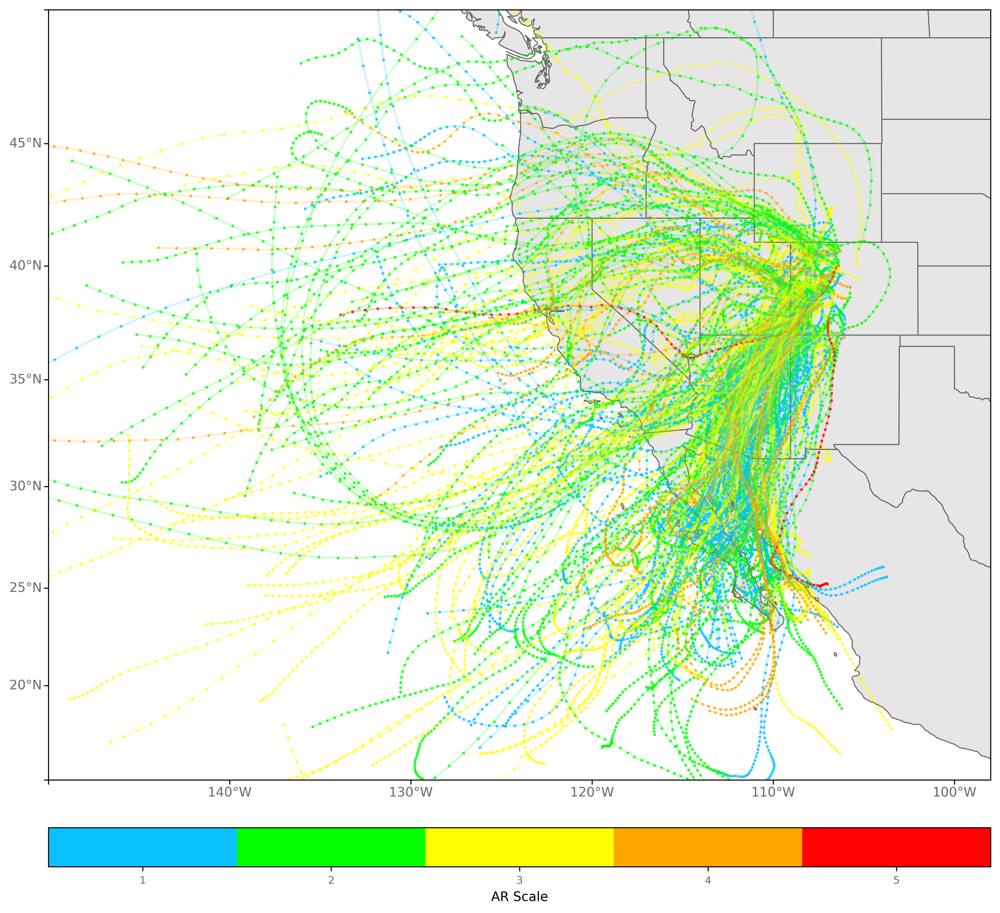

In [19]:
nrows = 2
ncols = 1

# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.Mercator() ## the projection you want your map displayed in

ext = [-150., -98., 15., 50.] 

# Set tick/grid locations
tx = 10
ty = 5
dx = np.arange(ext[0],ext[1]+tx,tx)
dy = np.arange(ext[2],ext[3]+ty,ty)

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 0.05], width_ratios = [1], wspace=0.01, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(13.0, 12.0))
fig.dpi = 600
fname = path_to_figs + 'ARScale_UpperColorado_condensed'
fmt = 'png'

############################
### PLOT AR SCALE VALUES ###
############################

colors = ['#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']

ax = fig.add_subplot(gs[0, 0], projection=mapcrs)
ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=True, right_lats=False)
ax.set_extent(ext, datacrs)
ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)

## Loop through AR scale values
for j in range(1, 6):
    try:
        AR = ds.where(ds.ar_scale == j, drop=True)
        for k, HUC8 in enumerate(AR.HUC8.values):
            tmp = AR.sel(HUC8=HUC8)
            tmp = tmp.where(tmp.ar_scale == j, drop=True)
            nevents = len(tmp.start_date)
            ## LOOP THROUGH TRAJECTORIES
            for i in range(nevents):
                data =tmp.isel(start_date=i)
                y_lst = data.lat.values
                x_lst = data.lon.values
                ax.plot(x_lst, y_lst, c=colors[j-1], transform=datacrs, alpha=0.2)
                cf = ax.scatter(x_lst, y_lst, c=colors[j-1], marker='.', transform=datacrs, alpha=0.7, s=6)
    except IndexError:
        pass

# # Add color bar
cbax = plt.subplot(gs[1,0]) # colorbar axis
plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()